# Data Fundamentals (H)
John H. Williamson -- Session 2020/2021

----

**This submission must be your own work; you will have to make a Declaration of Originality on submission.**



---

## Assessed
# Introduction to probability

### Notes
It is recommended to keep the lecture notes open while doing this lab exercise.

**This exercise is assessed**. Make sure you upload your solution by the deadline. See the notes at the bottom of this notebook for submission guidance. The exercise is marked out of 100.


In [1]:
# update jhwutils if you need to (and restart the kernel afterwards)
#!pip --no-cache install --user -U https://github.com/johnhw/jhwutils/zipball/master   

In [39]:
# Standard imports
# Make sure you run this cell!

from __future__ import print_function, division
import numpy as np  # NumPy
import scipy.stats 

from jhwutils.checkarr import array_hash, check_hash, check_scalar, check_string
import jhwutils.image_audio as ia
import jhwutils.tick as tick

# Set up Matplotlib
import matplotlib as mpl   
import matplotlib.pyplot as plt
%matplotlib inline
print("Everything imported OK")
plt.rc('figure', figsize=(8.0, 4.0), dpi=140)
np.random.seed(2019)
import lzma, base64
exec(lzma.decompress(base64.b64decode(b'/Td6WFoAAATm1rRGAgAhARYAAAB0L+Wj4AuQBIRdADSbSme4Ujxz95HdWLf4m39SX9b5yuqRd8UVk3DwULgMdEb8P1bLvis2Swz3hlDU+FwGvQQSXUZEv0GMy+ErARv0E4TRCmTvFyQ5JSb/G7uf1mJI1cRyyqS/p8OjxfizueERZipJkqifEM7mgPLl2o+B4OX/p+0Vu3LfTMRZvY//6V0JXZwRxDGVuddVdlsZOuNDNEzsXiiyo2fiXL31w0sXabfigUkJ4q1uo4W7C0THX7Lhb0zVk9A0/+f114CeChR9Gz25xOstbGjOodl1SDpP5rKIxkxZTzcjw65yJRKqid46CTa5ffWK7y9QtygL7IqcGB9ode3TKcTh57Edd9+wylW9BiSE8/qh/93qFavlXK1sjLdoTWEfPZ96HOR6La9g8KEEFNNMAc+7HtTv1JwoX8w+zLayLzdpIqA+HLAVFiVeFg4jPu8imDtmoOhe66WDgPWsXetR6FFCK7mw4q4Q+A4TCz6ugUoh/gIEGjIadianBQVSST062b8vSLzWmFYLKJoRPDHPyvFWKX5u27LZ9Bpswls2feqW6SBEvavwjckRwW5r4Fc6F+MEYgZmAUy8sJRXe7JHvp6LZ3o5RM92eQRoGsDeL82U2LC6sXfxy3MBj6Gd0wwWC9iJdyvs+laSdI41jk2lZUcDpVCBoSV/Zr+0rH1PsT33u2NlfDsaXrG67zKhbB+SSGz3OoN6Kq/1GwWf+GvNH3cySyrJOgN2edwh/fn87XMHk5QZCg0BtZRObATtZAoloB5jJGvjwqtxHCItkTdGoUi4TY75N3FMTPowFYUXn2tjAtngJibqtGbZ/+PaS7E134Lsvxy5o2uaBgoV+U9Mg1poz1QAl0YTKDNMZjVILDbKIRq9e2C4X6e3SWQRW4LrBujBJp7Q8AJjKIspFOLt7PzxOwkSHES90iNgMW4Sn+uTKwQEcTrtTZCDm5Bynn5taepEXp2hj2cmuZEGJCXX8HOM9RgnWyeOVDcUPRCGAGrjA3y7VZGuEjdPE4DT32dmqJabHrPtrc0tgde5UfefS8ezzGOEheOmYQEtpIZLY2TwuNbhOIvIxNfnDA7H7ug1LtCSTejYkGU9CztGzKkyoWEMSTGQSd7aEddrdDS8gsOF6r+RmhCutjGejXFHFtVEcL8FJxczfLdbWDNdBl69IrZ8vlV6Ts4FojBO0/w6HAv24jyX1r+4n3ymPeJZb2SR7HQ/4L2In4ywuUdCkI2t2UuB0fHYgA+ibCVPoXg5Da698PlcozIlD/cmP+3OAnEU+yPElHmLrfjGLFwmWN28ikbluPx0be9B7sn4qTJUY0zrOBuv+wS47A7j5XXicpakCHJcqDaEuzWCa6e1JRmIDoitnr+2kNbGDYNPgKKJE8XDvWVZTgnG1NCGhTZJlTL37hZZIuwkA5RbpnOlrEldKjGnol9D209OuritES1GvlL2H7lDtRTiMnHPHcHMnVqPg5usk3F2Zw23PtC1YDaHvqxgyqaXlRslElFtLz2k9GV2QC3bUxVVlf6jQgPkDoQhKu63JjQtoPRrn0AAR37PsnsFZ74AAaAJkRcAAHaUzMuxxGf7AgAAAAAEWVo=')).decode('ascii'))
 

Everything imported OK


## 1. Hunt the submarine: gridworld version

$$\newcommand{\vec}[1]{{\bf #1} } 
\newcommand{\real}{\mathbb{R}}
\newcommand{\expect}[1]{\mathbb{E}[#1]}$$

The USS Scorpion has been lost at sea. Your job is to model where it might be probabilistically. 

<img src="imgs/scorpion.jpg" width="50%">

In part 1 of this lab, we will assume that our world is divided into a 2D grid of squares, each of which might contain an errant submarine.

<img src="imgs/sea_grid.png" width="50%">

### Random variables, outcomes and events

We assume that the submarine's location is given by a random variable $X$ whose sample space is the space of 2D grid points $\vec{x}=[x,y]$ where $x$ and $y$ are integers in the range 0-15 (inclusive). (Be careful: this `x,y` order is the opposite of the `row, column` format used in images).

You are given a probability mass function as a 16x16 matrix `submarine_pmf` giving the probability of each grid square, i.e $f_X(\vec{x}) = P(X=\vec{x})$. 


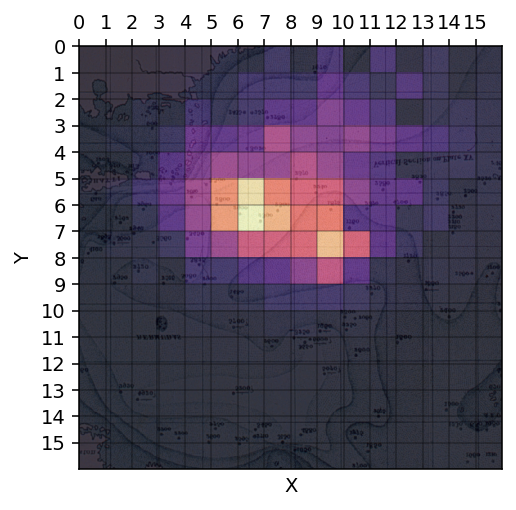

In [40]:
show_pmf(submarine_pmf) # show the PMF on top of a map

### Outcomes and events
Compute the the following values, all of which are scalars. The notation [x1, y1] -> [x2, y2] indicates a box that should **include** `x1,y1,x2,y2` (be careful!).

* `in_1_4` probability submarine is in square [1,4]
* `out_3_3` probability submarine is *not* in square [3,3]
* `west_6` submarine is in square [x<=6, y]
* `y_div_3` submarine has a y coordinate exactly divisible by 3
* `below_above` submarine is in square [x, y<10] or [x, y>=13]
* `box_1` submarine is in the box [1, 4] -> [3, 9] (inclusive!)
* `box_2` submarine is in the box [0, 0] -> [15, 15] (inclusive!)
* `evens` submarine has x>=8 and an even y coordinate
* `odds_not_box` the *odds* that the submarine is *not* in the box [0, 5] -> [5,10]
* `odds_even` the *odds* that the submarine has an x coordinate which is even
* `logit_3_7` the log-odds (logits) that the submarine is in square [3, 7]
* `dlogit_box` the *change* in log-odds from the hypothesis that the submarine is in the box [0,5] -> [5, 10] to being in the box [1,1] -> [5,5]



In [41]:
pmf = submarine_pmf
# YOUR CODE HERE

in_1_4 = pmf[1,4]

out_3_3 = 1-pmf[3,3]

west_6 = np.sum(pmf[0:7,:])

y_div_3 = np.sum(pmf[:,::3])

below_above = np.sum(pmf[:,0:10])
below_above += np.sum(pmf[:,13:16])

box_1 = np.sum(pmf[1:4,4:10])

box_2 = np.sum(pmf[0:16,0:16])

evens = np.sum(pmf[8:,::2])

odds_not_box = np.sum(pmf[0:6,5:11])  / (1- np.sum(pmf[0:6,5:11]))
print(odds_not_box)


odds_even = ((1-np.sum(pmf[::2,:]))/np.sum(pmf[::2,:]))
print(odds_even)


# The log-odds (logits) that the submarine is in square [15, 15]
logit_3_7 = np.log((pmf[3,7])/(1-(pmf[3,7])))

# The *change* in log-odds from the hypothesis that the submarine is in the box [0,5] -> [5, 10] to being in the box [1,5] -> [1,5]
p1 = np.sum(pmf[0:6,5:11])
p2 = np.sum(pmf[1:6,1:6])
dlogit_box = np.log((p1)/(1-p1)) - np.log((p2)/(1-p2))

0.1772376769700687
1.05506025853436


In [42]:
with tick.marks(1):
    assert check_scalar(in_1_4, '0xe7d4ba8d')

In [43]:
with tick.marks(1):
    assert check_scalar(out_3_3, '0x99c03236')

In [44]:
with tick.marks(1):
    assert check_scalar(west_6, '0x59f3b9f7')

In [45]:
with tick.marks(1):
    assert check_scalar(y_div_3, '0xdaa43a7a')

In [46]:
with tick.marks(1):
    assert check_scalar(below_above, '0x8ea462bf')

In [47]:
with tick.marks(1):
    assert check_scalar(box_1, '0x7db96774')

In [48]:
with tick.marks(1):
    assert check_scalar(box_2, '0xb44c37ea')

In [49]:
with tick.marks(1):
    assert check_scalar(evens, '0xe44a25c7')

In [50]:
with tick.marks(1):
    assert check_scalar(odds_not_box, '0x88193758')

In [51]:
with tick.marks(1):
    assert check_scalar(odds_even, '0x21d4e389')

In [52]:
with tick.marks(1):
    assert check_scalar(logit_3_7, '0x3f1ff384')

In [53]:
with tick.marks(1):
    assert check_scalar(abs(dlogit_box), '0x90acc72f')

### Expected value
You need to plan for the search operation. There is a fixed search station at square x=6, y=6. Assume the Euclidean (L2) norm in measuring distances. The time in hours to search a grid square from the station is given by `time = distance**2 + 4*distance + 10`.  Compute:

* `expected_location` Expected value of the submarine location.
* `expected_distance` expected value of the distance of the submarine to this fixed station 
* `total_search_time` the **total** search time required to search the every square on the entire grid. Assume each search of a grid square has to restart from the station.
* `expected_search_time` expected search time of a random search starting at the station.

**REMEMBER**, in general $$E[f(X)] \neq f(E[X]).$$

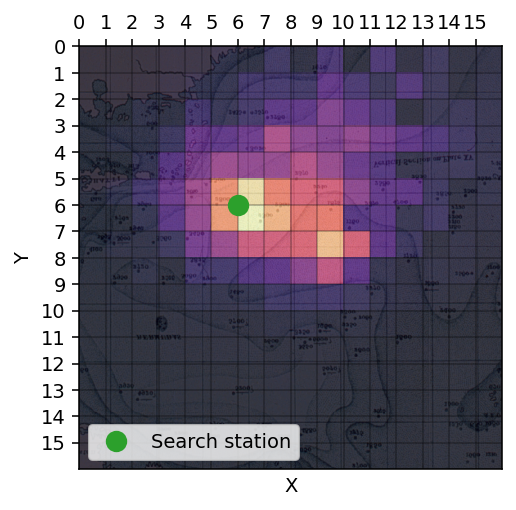

In [54]:
show_pmf(submarine_pmf)
plt.plot(6,6, 'C2o', label='Search station', markersize=10)
plt.legend(loc='lower left');

In [55]:
# YOUR CODE HERE
expected_location = np.zeros((2))
expected_distance = 0
total_search_time = 0
expected_search_time = 0 
for x in range (len(pmf)):
    for y in range (len(pmf)):
        expected_location[0] += pmf[x][y] * x
        expected_location[1] += pmf[x][y] * y
        
        distance = np.linalg.norm([6 - x, 6 - y])
        expected_distance += pmf[x][y] * distance
        
        duration = distance**2 + 4*distance +10
        total_search_time += duration
        
        expected_search_time += pmf[x][y] * duration

In [56]:
with tick.marks(4):
    assert check_scalar(expected_location[0], '0x4f9f5e7c')
    assert check_scalar(expected_location[1], '0x8805a495')

In [57]:
with tick.marks(2):
    assert check_scalar(expected_distance, '0x33d35673')

In [58]:
with tick.marks(2):
    assert check_scalar(total_search_time, '0xb1ca4255')

In [59]:
with tick.marks(4):
    assert check_scalar(expected_search_time, '0x52dc6b5b')

### Conditional probability
The search strategy could be improved if one of the $x$ or $y$ coordinates were known for sure (e.g. from another source, like satellite imaging). To identify how *much* this would help, we can use conditional probability distributions. Compute the following:


* `p_x_y` the *conditional* PMF of an finding the submarine on an x coordinate given a y coordinate $P(X_x=x|X_y=y)$ as 16x16 matrix
* `p_y_x` the *conditional* PMF of finding the submarine on a y coordinate given an x coordinate $P(X_y=y|X_x=x)$ as 16x16 matrix
* `p_y_6` the conditional PMF of the submarine being in squares with y=6, as a single 16 element vector.
* `p_even_x` the PMF of the submarine being on a given y coordinate if we know the submarine is in a grid square with even x coordinate, as a single 16 element vector. $P(X_y=y|X_x = x, x\ \text{even})$
* `p_even_y_odd_x` the PMF of the submarine being on an even y coordinate if we know the submarine is in a grid square with odd x coordinate, as a single **8 element** vector. $P(X_y=y|X_x = x, x\ \text{even}, y\ \text{odd})$



In [60]:
# YOUR CODE HERE
p_x_y = pmf/np.sum(pmf, axis=0)

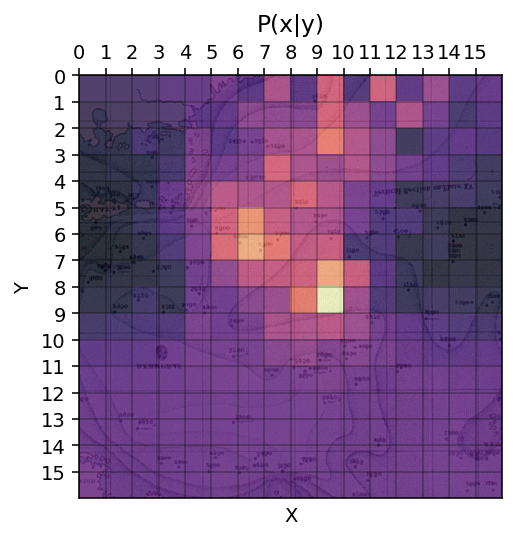

In [61]:
show_pmf(p_x_y, "P(x|y)")
with tick.marks(4):
    assert check_hash(p_x_y, ((16, 16), 2103.534977619737))


In [62]:
# YOUR CODE HERE
p_y_x = (pmf.T/np.sum(pmf, axis=1)).T

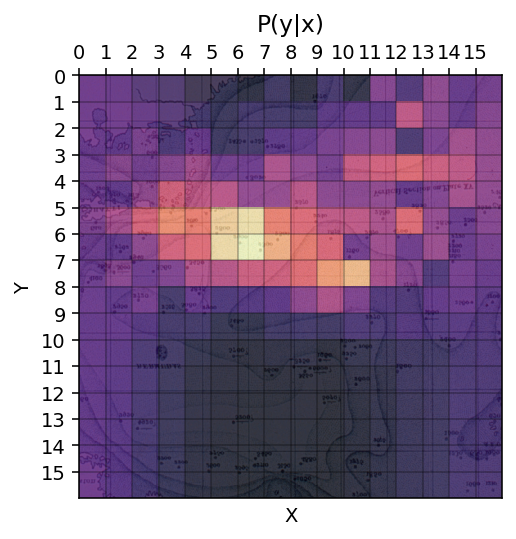

In [63]:
show_pmf(p_y_x, "P(y|x)")
with tick.marks(4):
    assert check_hash(p_y_x, ((16, 16), 2031.7414411989753))

In [64]:
# YOUR CODE HERE
p_y_6 = (pmf[:,6]/np.sum(pmf[:,6], axis=0))

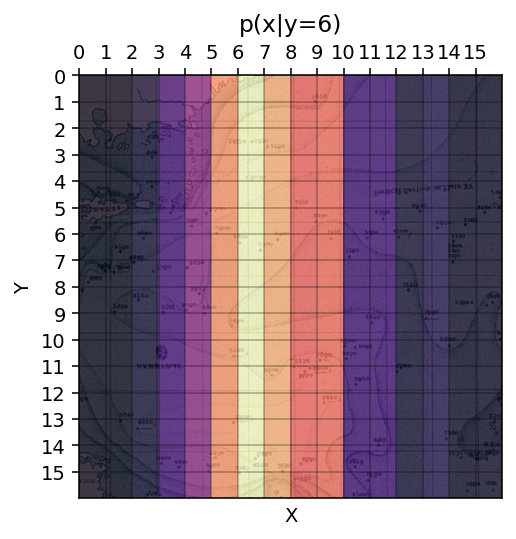

In [65]:
show_pmf(p_y_6[:,None], 'p(x|y=6)')
with tick.marks(4):
    assert check_hash(p_y_6, ((16,), 8.36846919881838))

In [66]:
# YOUR CODE HERE
p_even_x = np.sum(pmf[::2,:], axis = 0)/np.sum(np.sum(pmf[::2,:], axis = 0))

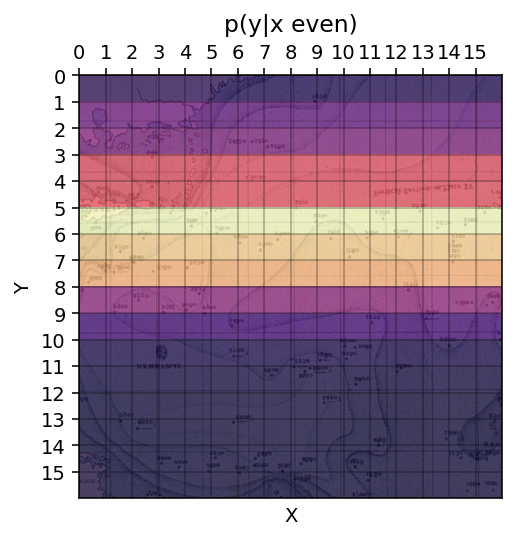

In [67]:
show_pmf(p_even_x[None,:], 'p(y|x even)')
with tick.marks(2):
    assert check_hash(p_even_x, ((16,), 7.1624313253524745))

In [68]:
# YOUR CODE HERE
p_even_y_odd_x = np.sum(pmf[1::2,::2], axis=0)
p_even_y_odd_x = p_even_y_odd_x / np.sum(p_even_y_odd_x)

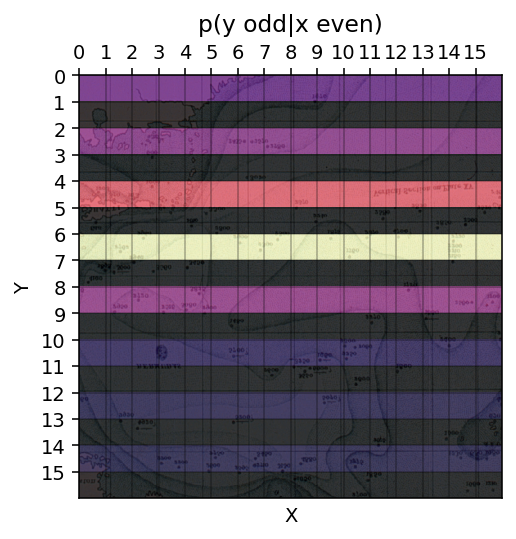

In [69]:
_pmf = np.stack([p_even_y_odd_x, 0*p_even_y_odd_x]).T.reshape(16,)
show_pmf(_pmf[None,:], 'p(y odd|x even)')
with tick.marks(2):
    assert check_hash(p_even_y_odd_x, ((8,), 4.434949227546914 ))

## Entropy
The search could be guided more intelligently if we could work out how informative getting one of the coordinates could be. For example, knowing which `x` coordinate would give you *most* information about the `y` coordinate?  Compute the entropy of each conditional distribution $H(Y|X=n)$ and store it in `entropy_x`. Use base 2 for the entropy (i.e. bits).
Store the most useful `x` coordinate to know in `most_informative_x`.


In [70]:
# YOUR CODE HERE
entropy_x = np.sum(-np.log2(p_y_x+1e-7)* p_y_x, axis=1)
most_informative_x = np.argmin(entropy_x)

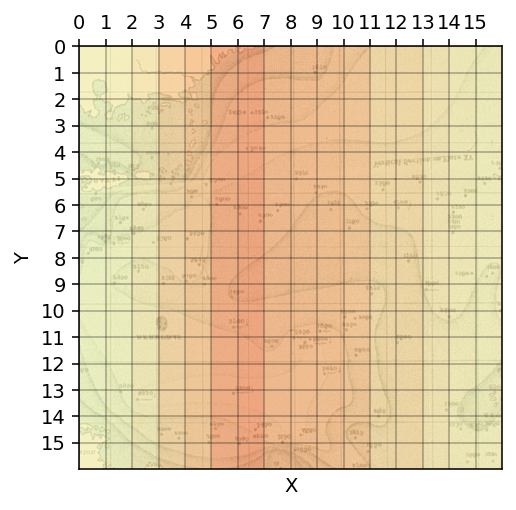

In [71]:
show_pmf(entropy_x[:, None])
with tick.marks(4):
    assert check_hash(entropy_x, ((16,), 509.16360658756037))

In [72]:
with tick.marks(2):
    assert check_scalar(most_informative_x, '0x9d772269')

## Validating pmfs

`submarine_pmf` is one possible model of the submarine location. A number of others have been proposed for this 16x16 gridworld model of searching by the scientific reserach team; but some of them are implemented incorrectly and are not valid PMFs. These probability mass functions are stored in a list of matrices 16x16 `proposed_pmfs`. Identify which of these PMFs are *valid* PMFs and store the valid ones in a list `valid_pmfs`.


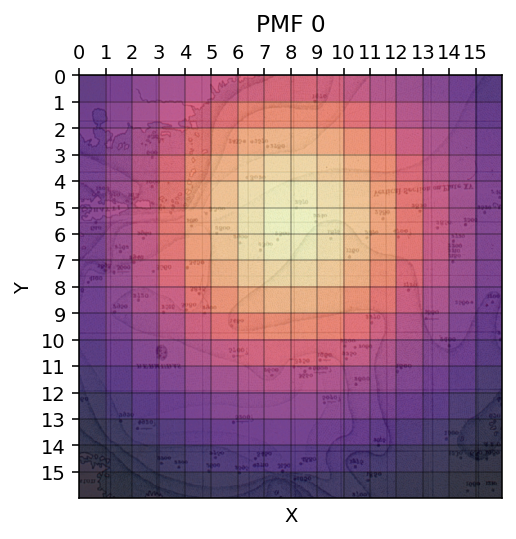

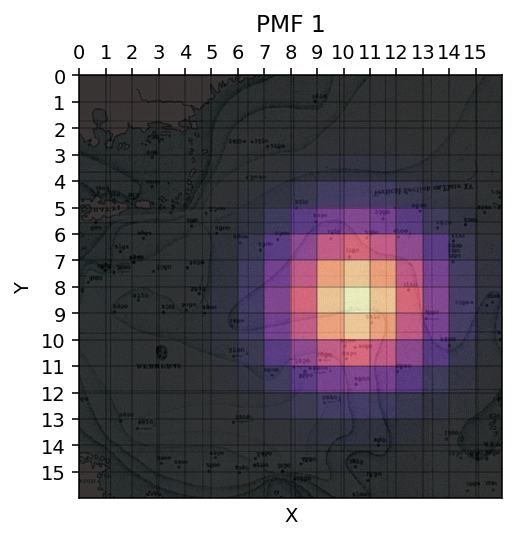

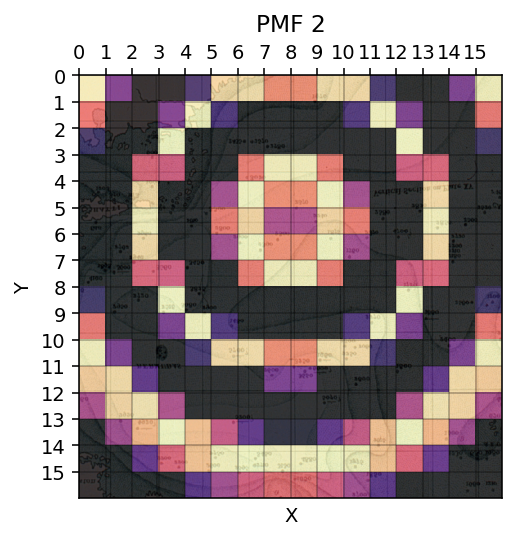

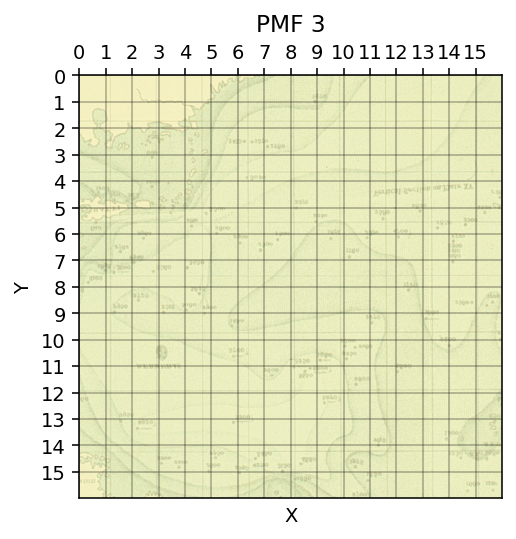

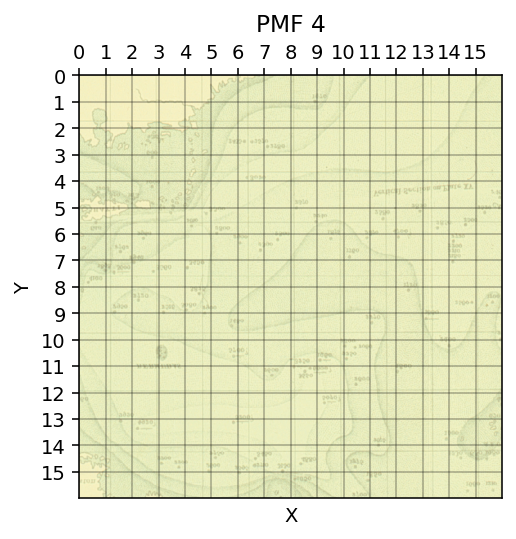

In [73]:
# show each of the PMFs
for i,pmf in enumerate(proposed_pmfs):
    show_pmf(pmf, title=f"PMF {i}")


In [74]:
# YOUR CODE HERE

In [75]:
with tick.marks(8):
    check_hash(valid_pmfs, ((2, 16, 16), 511.54549199055594 ))

NameError: name 'valid_pmfs' is not defined

## Sampling
We can use sampling to simulate where the submarine might lie on the sea floor. Write a function `sample_submarine(n)` which will randomly sample submarine locations according to `submarine_pmf`, returning a `nx2` array of sampled locations. Hint: there are 256 possible grid squares.

Note: your code may pass these tests but be incorrect; this will become apparent when you attempt the "reconstruct the PMF" part below.

In [76]:
# YOUR CODE HERE
valid_pmfs = []
for pmf in proposed_pmfs:
    if np.sum(pmf) == 1:
        valid_pmfs.append(pmf)  

In [77]:
with tick.marks(4):    
    for n in [2, 4, 10, 1000, 5000]:
        samples =  sample_submarine(n)
        assert samples.shape == (n,2)
        assert np.sum(samples - np.floor(samples)) == 0.0
        mean = np.mean(samples, axis=0)
        sem = np.std(samples, axis=0)/np.sqrt(n)    
        assert np.all((mean-sem < [7.93, 5.67]) | ([7.93, 5.67] < mean+sem))


### Reconstruct the PMF

From samples, we can reconstruct an approximation of the PMF. Write a function `reconstruct_pmf(samples)` that will reconstruct the PMF using the empirical distribution from a set of samples and return the reconstructed PMF as a 16x16 matrix. 


In [78]:
# YOUR CODE HERE
def reconstruct_pmf(samples):
    sample = np.zeros(256).reshape(16,16)
    stack_samples = (np.vstack({tuple(i) for i in samples}))
    
    for i in stack_samples:
        temp = 0
        
        for j in samples:
            if np.array_equal(i, j) == True:
                temp += 1
        x = int(i[0])
        y = int(i[1])
        sample[x,y] = (float(temp/len(samples)))
    return sample

<ipython-input-78-3e9bd6dda36a>:4: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  stack_samples = (np.vstack({tuple(i) for i in samples}))
<ipython-input-79-afe7aed4b8fe>:2: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.where((b<1e-10)|(a<1e-10), 0.0, a * np.log(a/b)))
<ipython-input-79-afe7aed4b8fe>:2: RuntimeWarning: invalid value encountered in multiply
  return np.sum(np.where((b<1e-10)|(a<1e-10), 0.0, a * np.log(a/b)))


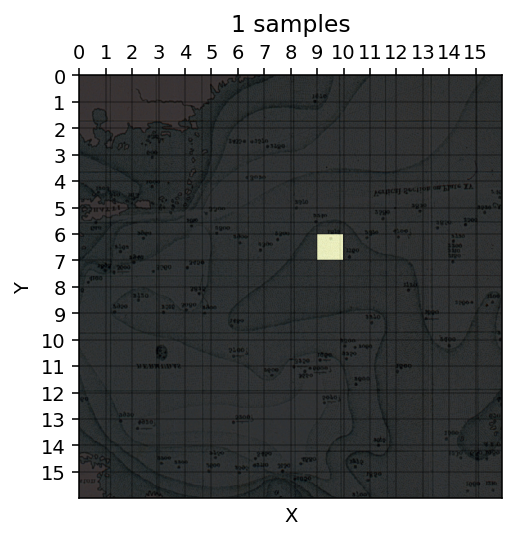

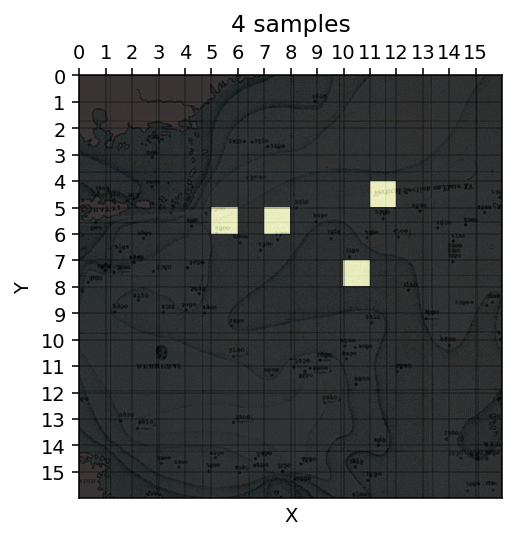

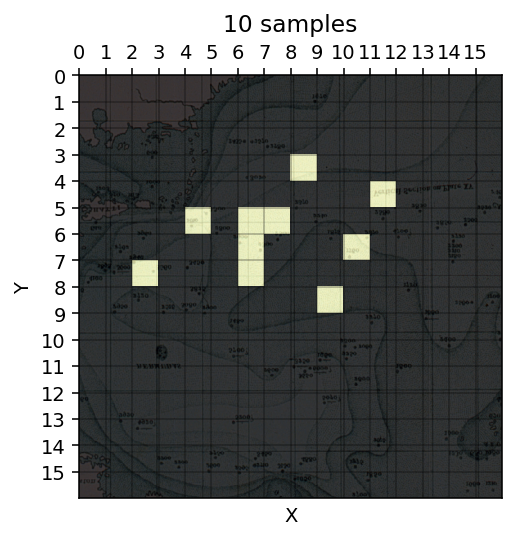

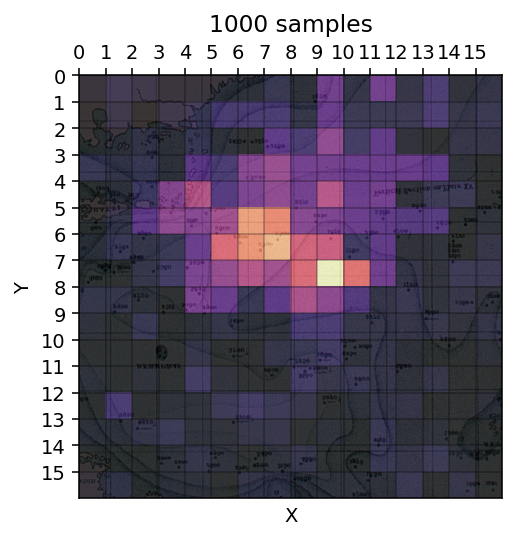

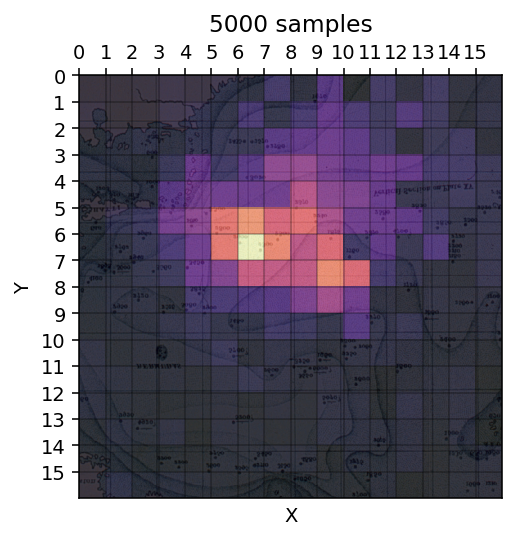

In [79]:
def kl(a, b):
    return np.sum(np.where((b<1e-10)|(a<1e-10), 0.0, a * np.log(a/b)))

with tick.marks(4):    
    kls = [4.0, 3.5, 2.5, 0.1, 0.02]
    for i,n in enumerate([1, 4, 10, 1000, 5000]):        
        approx_pmf =  reconstruct_pmf(sample_submarine(n))
        assert approx_pmf.shape == submarine_pmf.shape
        assert check_scalar(np.sum(approx_pmf), "0xb44c37ea")     
        assert np.max(approx_pmf)<=1.0
        assert np.min(approx_pmf)>=0.0
        kl_div = abs(kls[i] - kl(approx_pmf, submarine_pmf))/kls[i]        
        assert kl_div < 1.0             
        sample = reconstruct_pmf(sample_submarine(n))
        show_pmf(sample, f"{n} samples")        

### Log likelihood
Various theoretical models of oceanographic features have been used to simulate what happened to the submarine. 

* crater
* zeeman_shift
* oblov_1
* minority
* inviscid

Each of these models produces a collection of simulated submarine locations as a result.

`submarine_samples` provides a dictionary with samples from various named submarine position generating functions. Compute the *log*-likelihood of each sequence $\log \mathcal{L}(x_1, x_2,\dots)$ under the model defined by the PMF `submarine_pmf`. 
* `sequence_lliks`  a dictionary that maps the names to the log-likelihood.
* `most_likely_sequence` the name of the sequence is most likely to be compatible with this model.


In [80]:
print(submarine_samples.keys())

dict_keys(['crater', 'zeeman_shift', 'oblov_1', 'minority', 'inviscid'])


In [83]:
# YOUR CODE HERE
def log_likelihood(postions):
    sol = 0
    for pos in postions:
        sol = sol + np.log(submarine_pmf[pos[0], pos[1]])
    return np.sum(sol)

sequence_lliks = {
    "crater": log_likelihood(submarine_samples.get("crater")),
    "zeeman_shift": log_likelihood(submarine_samples.get("zeeman_shift")),
    "oblov_1": log_likelihood(submarine_samples.get("oblov_1")),
    "minority": log_likelihood(submarine_samples.get("minority")),
    "inviscid": log_likelihood(submarine_samples.get("inviscid"))
}

most_likely_sequence = max(sequence_lliks)

In [84]:
hashes = {
    "crater": "0x7315af59",
    "zeeman_shift": "0x73114def",
    "oblov_1": "0xeb8d319c",
    "minority": "0xf8150629",
    "inviscid": "0xfab3048e",
}

with tick.marks(4):
    for key in submarine_samples.keys():
        print(key, sequence_lliks[key])
        assert check_scalar(sequence_lliks[key], hashes[key])

crater -674.5851127039633
zeeman_shift -495.1125901495219
oblov_1 -603.5944982683787
minority -606.1277196511766
inviscid -553.3337126608025


In [85]:
with tick.marks(1):    
    assert check_string(most_likely_sequence, '0x57f0dda0')

### Bayes' rule

The function `search_submarine(x,y)` returns the **likelihood** for the submarine's location, given an `x` and `y` coordinate to search at based on sonar returns from a search ship. It returns this as a 16x16 matrix.

* `submarine_posterior` Using `submarine_pmf` as a prior, compute the posterior PMF using the result of `search_submarine(10, 7)` as likelihood. 

In [86]:
# YOUR CODE HERE
P_L = search_submarine(10,7) * submarine_pmf
submarine_posterior = P_L / np.sum(P_L)

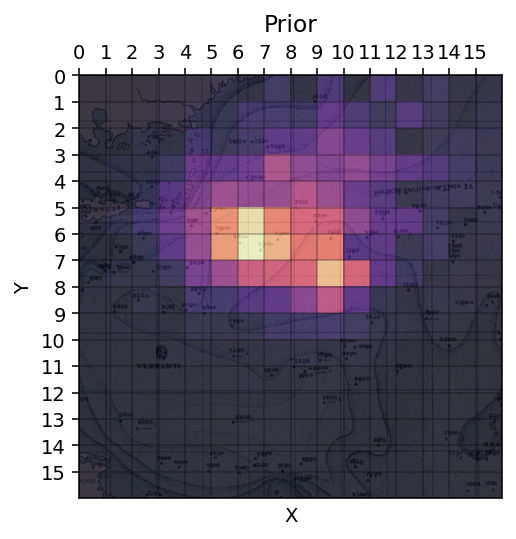

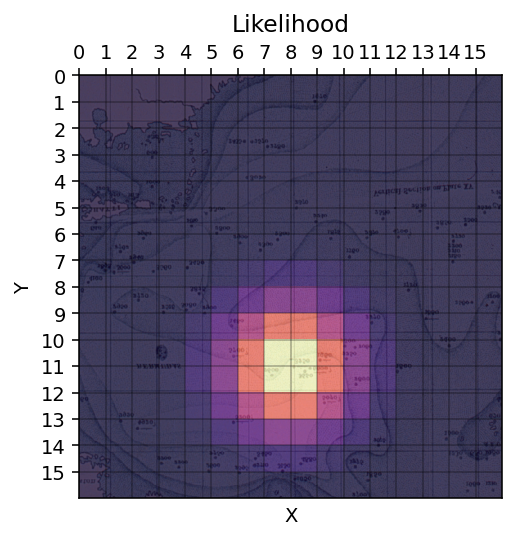

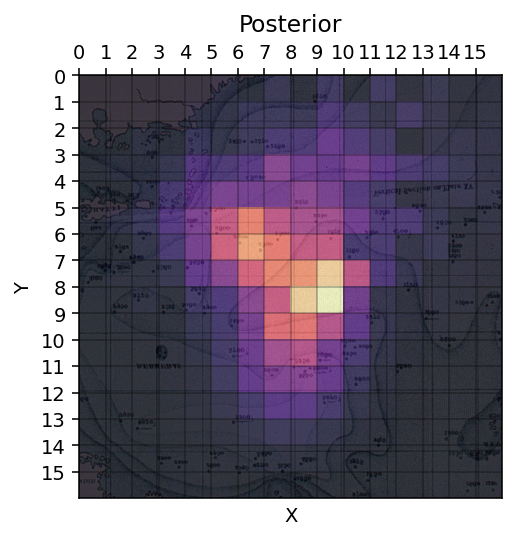

In [87]:

show_pmf(submarine_pmf, 'Prior')
show_pmf(search_submarine(10,7), 'Likelihood' )
show_pmf(submarine_posterior, 'Posterior')
with tick.marks(4):
    assert check_hash(submarine_posterior, ((16, 16), 129.2249265521699))

 ### Sequential searching
Compute the posterior distribution after searching the each of squares y=8, x=0..15 (i.e. testing *each* of these 16 squares in turn, and combining *all* of the evidence into a posterior), storing the posteriors as a list, *starting with the prior* and ending with the posterior after observing y=8, x=15. You should have a 17 element list of 16x16 matrices. Store this as `search_strip_posterior`

In [90]:
# YOUR CODE HERE
search_strip_posterior = [submarine_pmf]

for i in range(16):
    P_L = search_submarine(8,i) * search_strip_posterior[-1]
    submarine_posterior = P_L / np.sum(P_L)
    search_strip_posterior.append(submarine_posterior)

Got hash (17, 16, 16), 37034.380413251885 but expected (17, 16, 16), 37043.06602810632


AssertionError: 

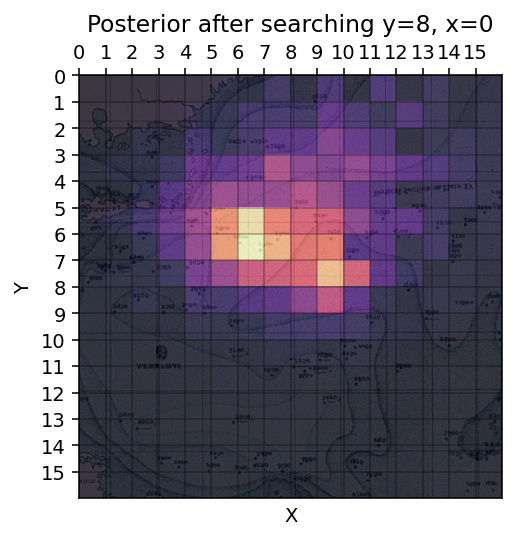

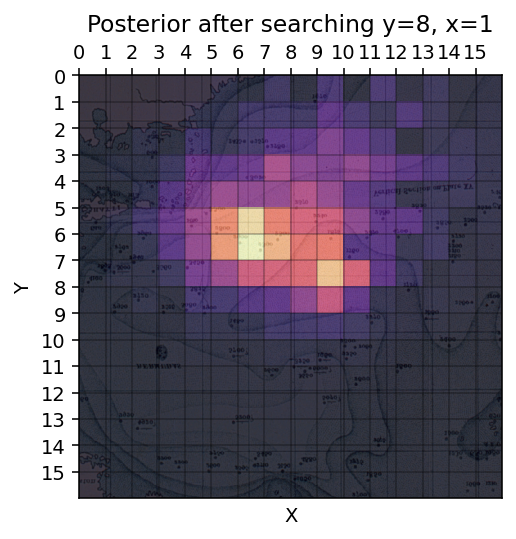

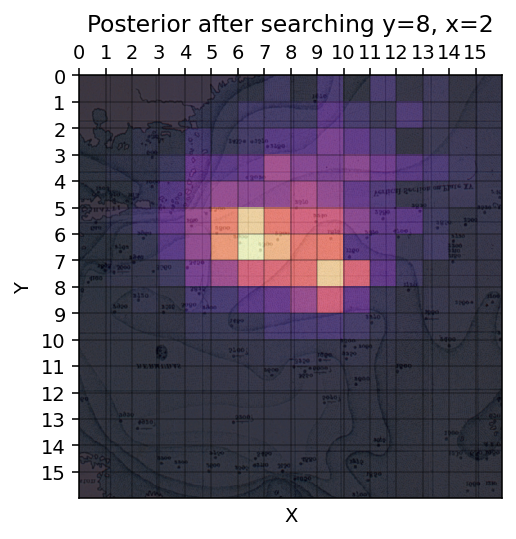

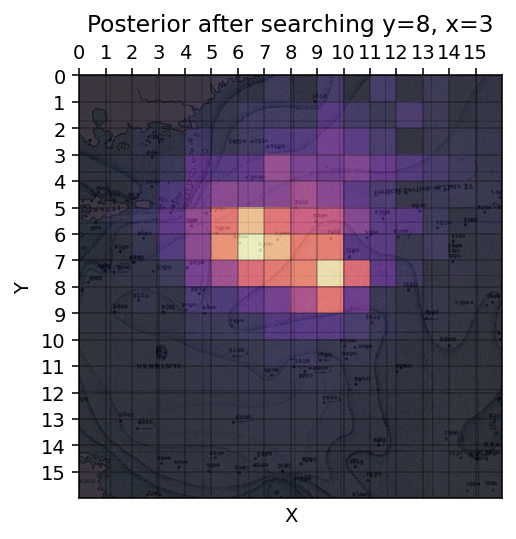

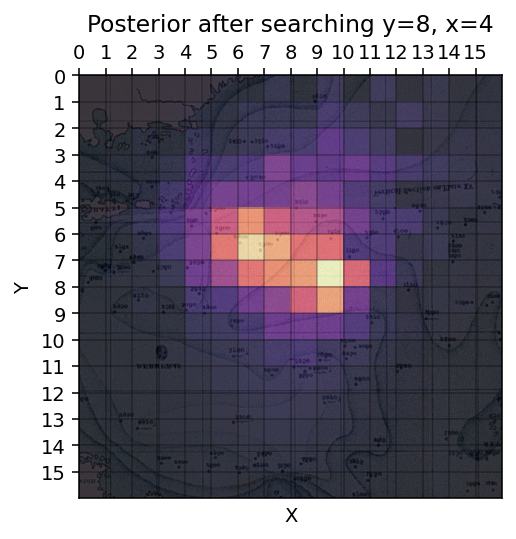

...

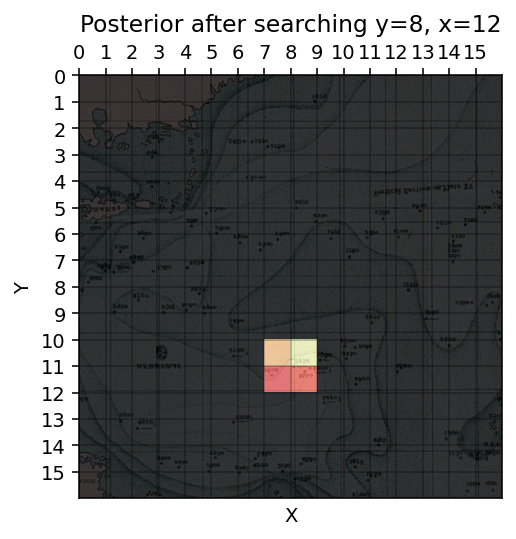

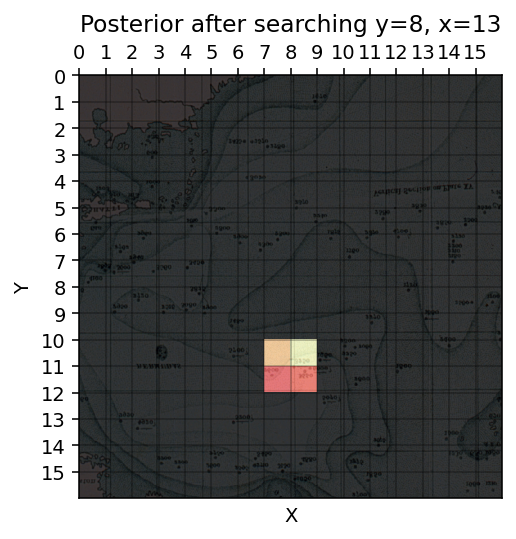

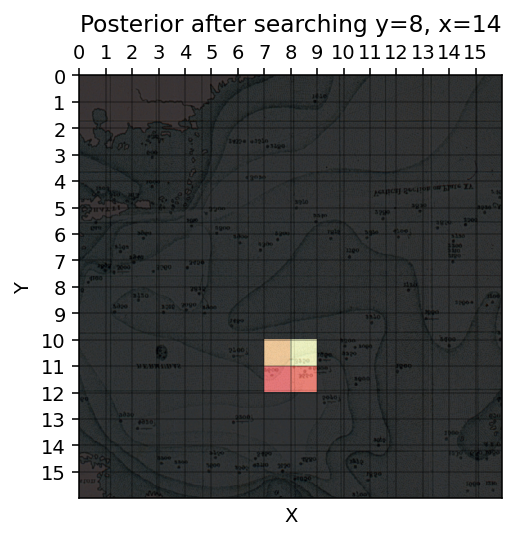

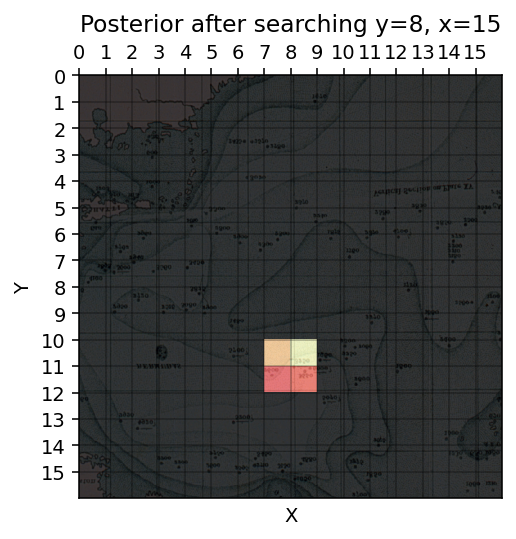

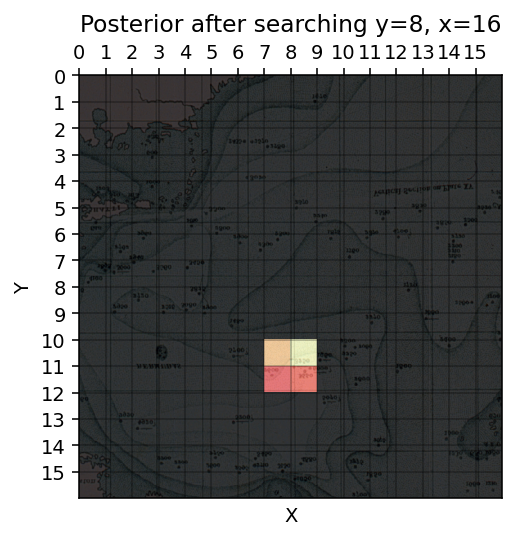

In [91]:

for i, p in enumerate(search_strip_posterior):
    show_pmf(p, f'Posterior after searching y=8, x={i}')
with tick.marks(4):
    assert check_hash(search_strip_posterior, ((17, 16, 16), 37043.06602810632))

## 2. Hunt the submarine: continuous version
The simple discrete grid model is easy to do computations with but not a very realistic model. A better world model is that locations are *continuous* in nature; for example points specified as longitude and latitude. To work with this model probabilistically, we need to use (multivariate, i.e. vector) **probability density functions** which map coordinates to *density*, not probability.


### Continuous distributions
A continuous random variable can be represented as a class that has parameters and that provides two functions:

* `llik` the log-likelihood of an observation
* `sample` that returns a sample from a distribution

It's also useful to have a way of drawing the density for debugging.

*You will need to use this class to solve the problems below*

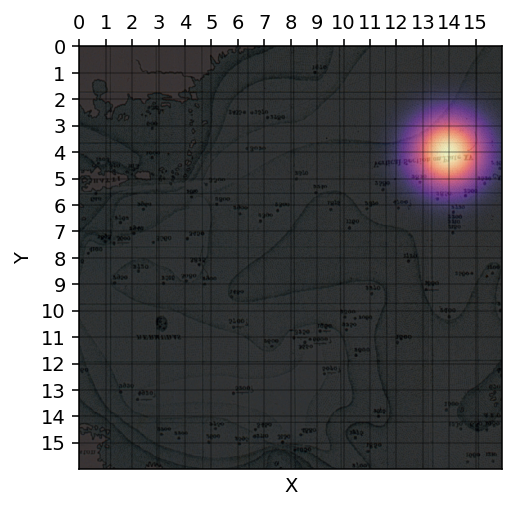

In [92]:
import scipy.stats
from jhwutils.ellipse import _cov_ellipse

class MultivariateNormal:
    
    def __init__(self, mu, sigma):
        # use the existing implementation in scipy.stats
        self.mu = mu
        self.sigma = sigma
        self.distribution = scipy.stats.multivariate_normal(self.mu, self.sigma)
    
    # log-likelihood of one observation
    def llik(self, x):
        return self.distribution.logpdf(x)
    
    # n random samples
    def sample(self, n):
        return self.distribution.rvs(n)        
        
    # render the distribution pdf as if it were a PMF
    def draw(self):            
        span = np.linspace(0,16,160)
        grid = np.array(np.meshgrid(span, span)).reshape(2, -1).T        
        pdf = self.distribution.pdf(grid)
        show_pmf(pdf.reshape(160,160).T)
        
        
# construct a new instance
x = MultivariateNormal(mu=(14,4), sigma=np.eye(2))        
x.draw()

### A. Fitting with direct computation

There are a collection of *observed* potential locations for the submarine from a search ship in `submarine_observations`. The problem is to fit the parameters of a PDF given these observations.


#### A.1 Estimation
Under the assumption that a reasonable model for the submarine location is a multivariate normal:

* directly fit parameters for a `MultivariateNormal` using standard numpy functions and store the result in `normal_mu` and `normal_sigma`.
* `llik_normal` the log-likelihood of the *entire* set of observations under this model (i.e. with these parameters)
* `samples_normal` 250 samples drawn from the multivariate normal model with these parameters
* `llik_misfit` how much smaller the log-likelihood of observations is compared to the samples *generated under the model* (i.e. `samples_normal`). This should be a negative number.

In [93]:
submarine_observations = np.loadtxt('data/submarine.txt')

In [94]:
np.random.seed(2019)
# YOUR CODE HERE
normal_mu  = submarine_observations.mean(axis=0)
normal_sigma = np.cov(submarine_observations, rowvar=False) 

x = MultivariateNormal(normal_mu, normal_sigma)

llik_normal = x.llik(submarine_observations).sum()
samples_normal = x.sample(250)
llik_misfit = x.llik(samples_normal).sum() - llik_normal

Text(0.5, 1.0, 'Log-likelihood = -861.07')

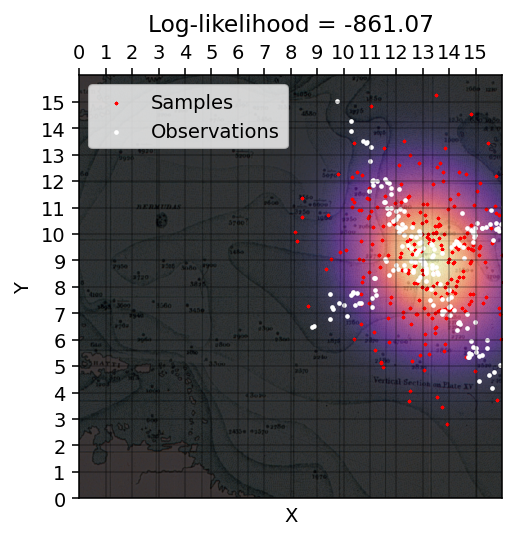

In [95]:
x = MultivariateNormal(normal_mu, normal_sigma)

x.draw()
ax = plt.gca()
ax.scatter(samples_normal[:,0], samples_normal[:,1], c='r', marker='x', s=1, label="Samples")
ax.scatter(submarine_observations[:,0], submarine_observations[:,1], marker='o', color='w', s=2, label="Observations")
ax.set_xlim(0,16)
ax.set_ylim(0,16)
ax.legend()
ax.set_title(f"Log-likelihood = {llik_normal:.2f}")

In [96]:
with tick.marks(4):
    assert check_hash(normal_mu, ((2,), 78.24708797223835))
    assert check_hash(normal_sigma, ((2,2), 30.158815848656694))
    

In [97]:
with tick.marks(2):
    assert samples_normal.shape == (250, 2)
    assert np.all(np.std(samples_normal, axis=0)>0.5)
    assert np.all(np.mean(samples_normal, axis=0) - np.array([13, 9]) < 4.0 * (np.std(samples_normal, axis=0)/np.sqrt(250)))
    

In [98]:
with tick.marks(1):
    assert check_scalar(llik_normal, '0xd33a3dae')


In [99]:
with tick.marks(1):
    assert check_scalar(llik_misfit, '0xf19b5a76', tol=1)

### B: A cross search pattern

Scientists argue that a better model for the location of the submarine is a cross-shaped density that reflects two possible ocean currents in the Atlantic and is also easier to search by ship. The scientists have written a probabilistic model which gives the density of a specialised "cross distribution". This is a non-standard distribution that has four parameters: `ctr`, `span`, `leg` and `angle`.

<img src="imgs/ship_cross.png" width="50%">



In [100]:
class CrossDistribution:
    def __init__(self, ctr, span, leg, angle):
        self.ctr = ctr
        leg = 1.0 + np.log(leg + 1.0)
        s, c = np.sin(np.radians(angle)), np.cos(np.radians(angle))
        r1 = np.array([[s / leg, c * leg], [c / leg, -s * leg]])
        r2 = np.array([[-c / leg, s * leg], [s / leg, c * leg]])
        scale = np.eye(2) * np.sqrt(span)
        self.arm1 = scipy.stats.multivariate_normal(self.ctr, r1 @ scale @ scale @ r1.T)
        self.arm2 = scipy.stats.multivariate_normal(self.ctr, r2 @ scale @ scale @ r2.T)

    # log-likelihood of one observation
    def llik(self, x):
        return np.log((self.arm1.pdf(x) + self.arm2.pdf(x)) / 2.0)

    # n random samples
    def sample(self, n):
        a1_samples = self.arm1.rvs(n)
        a2_samples = self.arm2.rvs(n)
        return np.where(np.random.uniform(0, 1, n) < 0.5, a1_samples.T, a2_samples.T).T

    # render the distribution pdf as if it were a PMF
    def draw(self):
        span = np.linspace(0, 16, 160)
        grid = np.array(np.meshgrid(span, span)).reshape(2, -1).T

        pdf = 0.5 * self.arm1.pdf(grid) + 0.5 * self.arm2.pdf(grid)
        show_pmf(pdf.reshape(160, 160).T)

**Try varying these parameters and viewing the resulting distributions to understand what effect they have:**

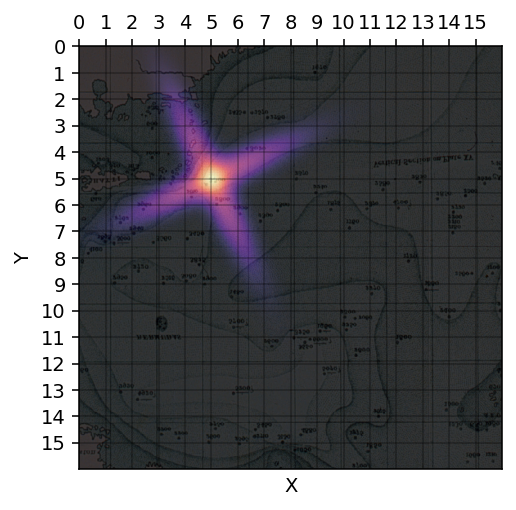

In [101]:
cf = CrossDistribution(ctr=(5,5), span=1, leg=3.0, angle=25.)

cf.draw()


## Expectation

We would like to be able to compute the expected location (and search time/distance) for this model. But we can't do a simple operation with a PDF like we could with the PMF model. Instead, we can use sampling methods to approximate the expectation $\hat{\mathbb{E}}[f(X)]$.

Using the same formula `time = distance**2 + 4*distance + 10` as in Part 1, use the Monte Carlo approximation to the expectation, with 1000 samples, to compute:

* `cross_expected_location` the expected location  (a 2D vector)
* `cross_expected_distance` expected L2 distance from the fixed station at (14,2) 
* `cross_expected_time`  expected search time in hours from this station.

with a cross distribution having the parameters:
    
        ctr = (6,10)
        span = 0.5
        leg = 8.0
        angle = 45.0

**NB: Set a fixed random seed at the start of the cell with `np.random.seed()` to guarantee reproducibility!**


In [116]:
np.random.seed(2019)

# YOUR CODE HERE
cross_expected_location = np.zeros(2)
cross_expected_distance = 0
cross_expected_time = 0

c_d = CrossDistribution(ctr=(6,10), span=0.5, leg=8.0, angle=45.)
c_d_samples = c_d.sample(1000)
llik_samples = c_d.llik(c_d_samples).sum()

for sample in c_d_samples:
    x = sample[0]
    y = sample[1]
    
    cur = c_d.llik(sample)/llik_samples
    dur = ((np.linalg.norm([14,2]-np.array([x,y])))**2) + 4* ( np.linalg.norm([14,2] - np.array([x,y])) ) + 10
    
    cross_expected_location[0] += x*cur
    cross_expected_location[1] += y*cur
    
    cross_expected_distance += cur*(np.linalg.norm([14,2]-np.array([x,y])))
    cross_expected_time += cur * dur

In [117]:
print(cross_expected_location)
print(cross_expected_distance)
print(cross_expected_time)

[6.08842357 9.96446587]
11.364024279710328
188.54063517873237


In [118]:
with tick.marks(2):
    assert check_scalar(np.sum(cross_expected_location), '0x36c7c001', tol=1)
    
    

In [119]:
with tick.marks(2):
    assert check_scalar(cross_expected_distance, '0x84e71c11', tol=1)
    

In [120]:
with tick.marks(3):   
    assert check_scalar(cross_expected_time, '0x2d9e066a', tol=1)

### C. Fitting with MLE
There is no direct form to compute the parameters  `ctr`, `span`, `leg` and `angle` from `submarine_observations` in the way we could for the simple normal distribution. 

Using stochastic hill-climbing (copy your code from the optimisation lab) and the idea of **maximum likelihood**, optimise to find the best parameter settings `theta= [ctr_x, ctr_y, span, leg, angle]` given these observations. 

Assume that the following constraints must be applied in the optimisation:

* `ctr` must be a vector in [0,0] to [16,16], 
* `span` must be a scalar in range 0.0 to 20.0
* `leg` must be a scalar from 0.0 to 10.0
* `angle` must be a scalar from 0.0 to 90.0

find a best-fit estimate for `theta`. You should be able to find a good fit within 10,000 iterations. You will need to modify the stochastic hill climbing code to enforce these constraints (hint: you can use `np.clip` for this).

In [110]:
np.random.seed(2019)
# YOUR CODE HERE
def l(theta):
    cD = CrossDistribution(ctr=(theta[0], theta[1]), span=theta[2], leg=theta[3], angle=theta[4])
    return -np.sum((cD.llik(submarine_observations)))

def guess():    
    guess = np.zeros(5)
    guess[0] =  np.random.uniform(0,16)
    guess[1] = np.random.uniform(0,16)
    guess[2] = np.random.uniform(0,20)
    guess[3] = np.random.uniform(0,10)
    guess[4] = np.random.uniform(0,90)
    return guess

def hill_climbing(l, max_iters, guess_fn, neighbour_fn):
     
    theta = guess_fn()
    lossOrg = l(theta)
    
    for i in range(max_iters):
        propose = neighbour_fn(theta)
        lossProp = l(propose)
        
        if lossProp < lossOrg:
            theta = propose
            lossOrg = lossProp
    return theta
    
def neighbour(x):
    neighbour = np.random.normal(0,0.05, x.shape)+x
    neighbour[0] = sorted((0,neighbour[0],16))[1]
    neighbour[1] = sorted((0,neighbour[1],16))[1]
    neighbour[2] = sorted((0.0,neighbour[2],20.0))[1]
    neighbour[3] = sorted((0.0,neighbour[3],10.0))[1]
    neighbour[4] = sorted((0.0,neighbour[4],90.0))[1]
    return neighbour

theta = hill_climbing(l, 10000, guess, neighbour)

(0.0, 16.0)

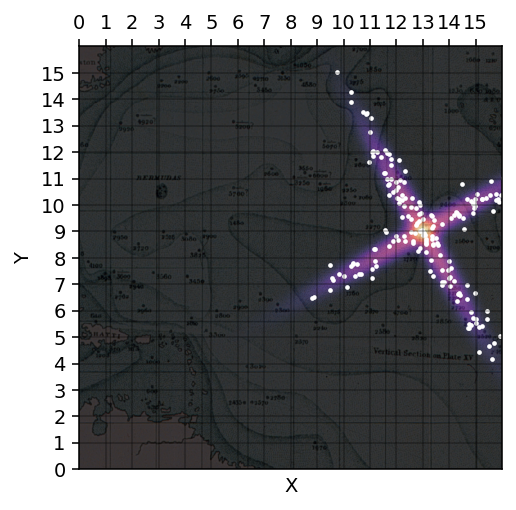

In [111]:
cf = CrossDistribution(ctr=(theta[0],theta[1]), span=theta[2], leg=theta[3], angle=theta[4])
cf.draw()
ax = plt.gca()
ax.scatter(submarine_observations[:,0], submarine_observations[:,1], marker='o', color='w', s=2, label="Observations")
ax.set_xlim(0,16)
ax.set_ylim(0,16)

In [112]:
with tick.marks(10):
    np.random.seed(2019)
    test_pts = np.random.uniform(0,50,(5,5)) 
    witnesses = np.linalg.norm(test_pts - theta, axis=1, ord=2)
    distance = np.linalg.norm(witnesses - np.array([54.4, 75.2, 66.3, 47.52, 56.12]))    
    assert distance < 1

-------------

## END OF ASSESSED PORTION

-------------

### D. Bayesian estimation
The code below implements the Metropolis sampler from the lecture notes using log-probabilities. It is a slight modification of hill-climbing search:

In [ ]:
def metropolis(log_fx, q, x_init, n):
    # Perform Metropolis MCMC sampling.
    # log_fx(x): a function that can be evaluated anywhere.
    # p(x) returns the log probability of at x
    # q(x): a function q that draws a sample from a symmetric distribution and returns it
    # x_init: a starting point
    # n: number of samples
    x = x_init
    samples = []
    for i in range(n):
        # find a new candidate spot to jump to
        x_prime = q(x)
        p_r = log_fx(x_prime) - log_fx(x)
        r = np.random.uniform(0, 1)
        if r < np.exp(p_r):
            x = x_prime
            samples.append(x_prime)
        else:
            samples.append(x)

    return np.array(samples)

#### D.2 The prior

You can get the log-likelihood of a observation $\mathcal{L}(x|\theta)$ uniform distribution `X ~ U(loc, loc+scale)` like this:

In [ ]:
scipy.stats.uniform(loc=0, scale=5).logpdf(1.0) # P(X=x), X~U(0,5)

In [ ]:
# infinite; this is impossible if x is U(0,5)
scipy.stats.uniform(loc=0, scale=5).logpdf(20.0) # P(X=x), X~U(0,5)

Likewise, we can compute the log-likelihood under a normal distribution, given a mean (loc) and a standard deviation (scale).

In [ ]:
scipy.stats.norm(loc=0, scale=5).logpdf(1.0) # P(X=x), X~N(0, 5^2)

In [ ]:
scipy.stats.norm(loc=0, scale=1).logpdf(1.0) # P(X=x), X~N(0, 1^2)

In [ ]:
scipy.stats.norm(loc=0, scale=0.1).logpdf(1.0) # P(X=x), X~N(0, 1^2)

We can sample using `rvs` instead of `logpdf`:

In [ ]:
scipy.stats.norm(loc=0, scale=0.1).rvs(5) # 5 samples from N(0,0.1)

Using these definitions, write a class `MyPrior` which has the `llik` and `sample` methods as `CrossDistribution` and `MultivariateNormal` had, which operates on the vector `theta=[ctr_x, ctr_y, span, leg, angle]` using the following priors for each component:

* `ctr_x` ~ U(0,16)
* `ctr_y` ~ U(0,16)
* `span` ~ N(2,5)
* `leg` ~ N(4, 4)
* `angle` ~ U(0,90)

In [ ]:
# YOUR CODE HERE

In [ ]:
with tick.marks(0):
    m = MyPrior()  
    assert m.llik([-10,0,0,0,0])==-np.inf
    assert m.llik([0,-10,0,0,0])==-np.inf
    assert m.llik([0,0,0,0,-10])==-np.inf

    for i in range(10):        
        samples = m.sample(10)    
        assert samples.shape == (10, 5)
        for s in samples:
            assert (m.llik(s) - 15.5)<1.0

Using the q function (proposal defined below), draw 1000 samples from the prior using the Metropolis algorithm, starting at [8,8,1,1,45]

In [ ]:
# simple proposal
def q(theta):
    return theta + np.random.normal(0, 0.4, theta.shape)

In [ ]:
# YOUR CODE HERE

## D.3 Inference
Using the prior defined by `MyPrior` and the data under the cross distribution model, sample 5000 samples using both the prior and likelihood to perform Bayesian inference. Use the same proposal distribution and starting point as the previous.
Store the results in `cross_trace`.

In [ ]:
m = MyPrior()
def llik(theta):        
    return m.llik(theta) - cross_llik(theta)

cross_trace = metropolis(llik, q, np.array([8,8,1,1,45]), 5000)

## D.4 Visualise
Find a way to visualise the results, for example showing sampled fits, showing histograms of the theta vector components.

-----

# Submission instructions

## Before submission

* Make sure you fill in any place that says `YOUR CODE HERE` or `"YOUR ANSWER HERE"`.
* SAVE THE NOTEBOOK





<div class="alert alert-block alert-danger">
    
### Formatting the submission
* **WARNING**: If you do not submit the correct file, you will not get any marks.
* Submit this file **only** on Moodle. It will be named `<xxx>.ipynb`.

</div>


## Penalties (only for assessed labs)
<font color="red">
    
**Malformatted submissions**
</font>
These assignments are processed with an automatic tool; failure to follow instructions *precisely* will lead to you automatically losing two bands in grade regardless of whether the work is correct (not to mention a long delay in getting your work back). **If you submit a file without your work in it, it will be marked and you will get 0 marks.**

<font color="red">**Late submission**</font>
Be aware that there is a two band penalty for every *day* of late submission, starting the moment of the deadline.

<font color="red">
    
**Plagiarism**
</font> Plagiarism will be subject to the Plagiarism Policy. The penalties are severe.